In [17]:
using Arpack
using LinearAlgebra
using CairoMakie
using LaTeXStrings
using Statistics
using Revise
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/Lattice_setup/lattice_BZ.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/Spinors/rmg_spinors.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/3P_funcs/patch_methods.jl")

C_dy (generic function with 1 method)

In [18]:
# general parameters
pd = 50
kappa = 1
m_kappa = 10^(-1) * kappa
w = 10^(-1) * m_kappa

0.010000000000000002

In [19]:
# RMG parameters
a = 4*pi/(3*kappa)
uD = 10
t0 = 3
t1 = 5
t2 = -0.21
t3 = 0
t4 = 0
Nl = 3
index = 1

1

In [20]:
# 3-patch parameters
delta = -1
vF = 0

0

<font size="12">BC as a function of Spacing</font>

In [21]:
function rmg_bc_spacing(a, uD, t0, t1, t2, t3, t4, Nl, l, kappa, m_kappa, vF, delta, alpha_list, w, p, pd)
    temp_list = range(-2, 3, 10^3)
    spacing_list = 10 .^(temp_list)


    curvature_1 = Array{Float64}(undef, length(spacing_list))
    curvature_2 = Array{Float64}(undef, length(spacing_list))
    curvature_3 = Array{Float64}(undef, length(spacing_list))

    P = Figure(size=(3000, 2000), fontsize=30)

    for j in 1:length(alpha_list)
        alpha = alpha_list[j]
        for i in 1:length(spacing_list)
            spacing = (w / 2 / pd) / spacing_list[i]

            x = p * cos(10*pi/7)
            y = p * sin(10*pi/7)
            grid = reshape([x, y], (1, 2))

            curvature_1[i] = rmg_patch_bc(grid, spacing, a, uD, t0, t1, t2, t3, t4, Nl, l, m_kappa, vF, delta, alpha)[1]
            curvature_2[i] = rmg_spinor_bc(grid, spacing, a, uD, t0, t1, t2, t3, t4, Nl, l)[1]
            curvature_3[i] = bc_no_spinors(grid, spacing, vF, delta, alpha)[1]
        end
        ax1 = Axis(P[j, 1], title = string(angle(alpha) / pi), xlabel = L"\frac{1}{spacing}", ylabel = L"\Omega", xscale = log10)
        lines!(ax1, spacing_list, curvature_1)
        ax2 = Axis(P[j, 2], title = string(angle(alpha) / pi), xlabel = L"\frac{1}{spacing}", ylabel = L"\Omega", xscale = log10)
        lines!(ax2, spacing_list, curvature_2)
        ax2 = Axis(P[j, 3], title = string(angle(alpha) / pi), xlabel = L"\frac{1}{spacing}", ylabel = L"\Omega", xscale = log10)
        lines!(ax2, spacing_list, curvature_3)
    end
    axs1 = Axis(P[:, 1], title = L"\text{RMG 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)

    axs2 = Axis(P[:, 2], title = L"\text{Parent } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs2, label = false)
    hidespines!(axs2)

    axs3 = Axis(P[:, 3], title = L"\text{Pure 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs3, label = false)
    hidespines!(axs3)
    
    P
end

rmg_bc_spacing (generic function with 1 method)

In [22]:
# parameters
alpha_list = (10^3) * [exp(pi/3 * im), exp(pi/4 * im), exp(pi/2 * im)]
p = 10^(-5) * w

1.0000000000000002e-7

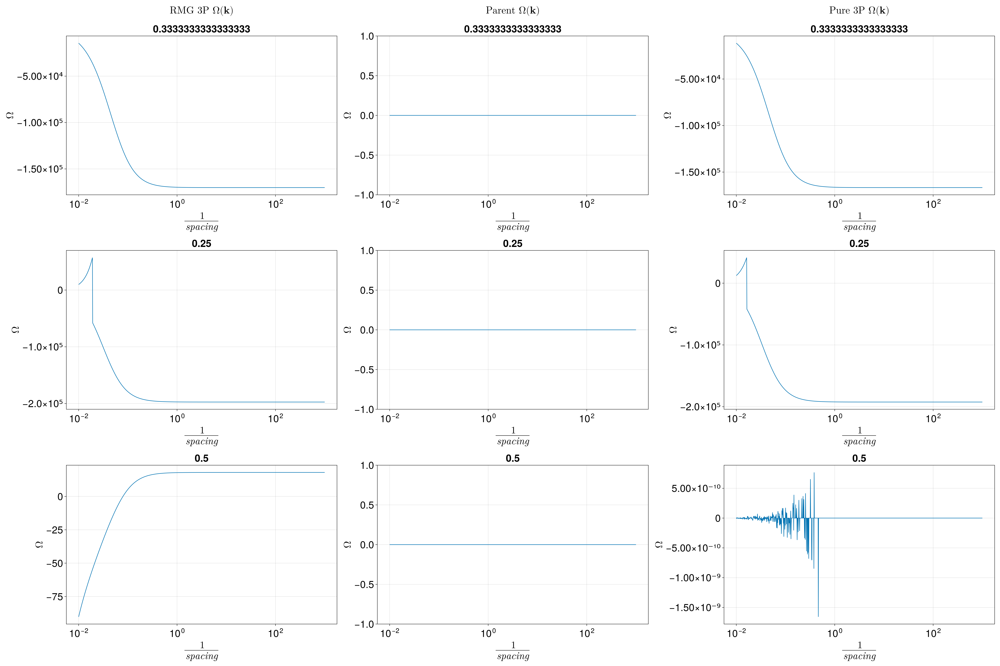

In [23]:
rmg_bc_spacing(a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, m_kappa, vF, delta, alpha_list, w, p, pd)

<font size="12">Large alpha limit</font>

In [24]:
alpha_list = (10^3) * [exp(pi/3 * im), exp(pi/4 * im), exp(pi/2 * im)]
p = w/2

0.005000000000000001

In [25]:
function rmg_decoupled_comp(a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, m_kappa, vF, delta, alpha_list, w, pd)
    # get an mBZ centered at the kappa-point
    grid = make_hex([10^(-16), 10^(-16)], w / 2, w / 2 / pd)

    spacing = 10^(-2) * (w / 2 / pd)

    fig = Figure(size=(1600, 800 * length(alpha_list)), fontsize=25)

    for j in 1:length(alpha_list)
        alpha = alpha_list[j]

        spinor_bc = rmg_decoupled_bc(grid, spacing, a, uD, t0, t1, t2, t3, t4, Nl, index, m_kappa, vF, delta, alpha)

        patch_bc = rmg_patch_bc(grid, spacing, a, uD, t0, t1, t2, t3, t4, Nl, index, m_kappa, vF, delta, alpha)

        ax1 = Axis(fig[j, 1], title = string(round(angle(alpha) / pi, sigdigits=3)), 
        xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax1, grid[:, 1], grid[:, 2], patch_bc, colormap = :Spectral)
        X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], patch_bc, colormap = :Spectral)
        cb1 = Colorbar(fig[j, 2], tr1)

        ax3 = Axis(fig[j, 3], title = string(round(angle(alpha) / pi, sigdigits=3))
        , xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax3, grid[:, 1], grid[:, 2], spinor_bc, colormap = :Spectral)
        X, ax3, tr3 = tricontourf(grid[:, 1], grid[:, 2], spinor_bc, colormap = :Spectral)
        cb3 = Colorbar(fig[j, 4], tr3)
    end
    ax_c1 = Axis(fig[:, 1], title = L"\text{RMG 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(ax_c1, label = false)
    hidespines!(ax_c1)

    ax_c2 = Axis(fig[:, 3], title = L"\text{RMG Decoupled } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(ax_c2, label = false)
    hidespines!(ax_c2)

    fig
end

rmg_decoupled_comp (generic function with 1 method)

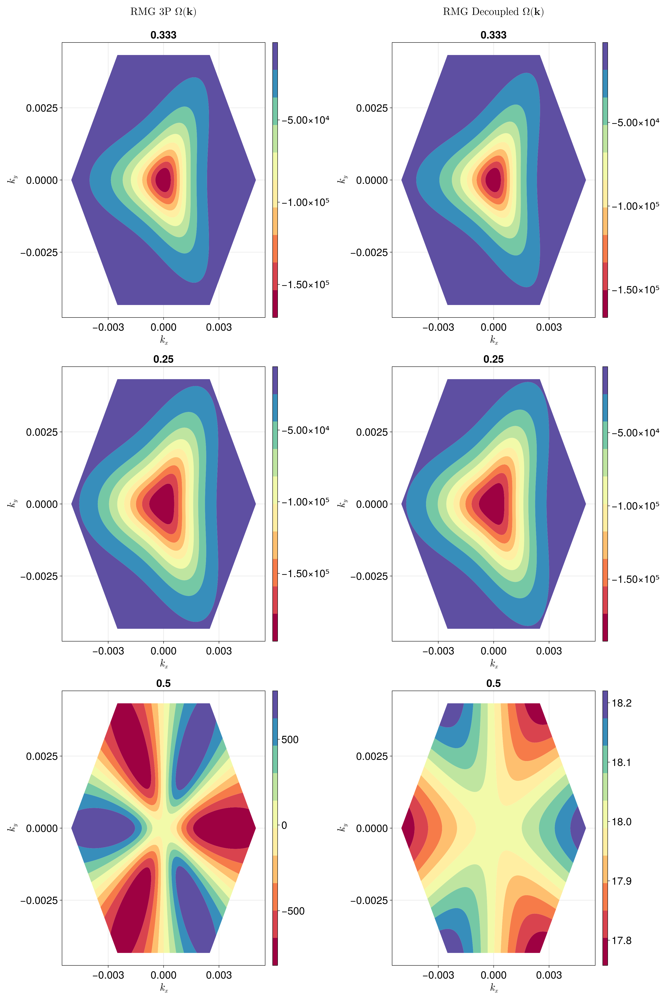

In [26]:
rmg_decoupled_comp(a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, m_kappa, vF, delta, alpha_list, w, pd)

In [27]:
function rmg_decouple_theta_bc(a, uD, t0, t1, t2, t3, t4, Nl, l, kappa, m_kappa, vF, delta, alpha_list, w, p, pd)
    theta_list = range(0, 2*pi, 1000)
    curvature_ns_1 = Array{Float64}(undef, length(theta_list))
    curvature_ns_2 = Array{Float64}(undef, length(theta_list))
    curvature_ns_4 = Array{Float64}(undef, length(theta_list))
    curvature_ns_5 = Array{Float64}(undef, length(theta_list))
    curvature_ns_3 = Array{Float64}(undef, length(theta_list))
    spacing = 10^(-2) * (w / 2 / pd)
    # create plot
    P = Figure(size=(3500, 2000), fontsize=30)
    for j in 1:length(alpha_list)
        alpha = alpha_list[j]
        for i in 1:length(theta_list)
            theta = theta_list[i]
            x = p * cos(theta)
            y = p * sin(theta)
            grid = reshape([x, y], (1, 2))

            curvature_ns_1[i] = rmg_patch_bc(grid, spacing, a, uD, t0, t1, t2, t3, t4, Nl, l, m_kappa, vF, delta, alpha)[1]

            curvature_ns_2[i] = rmg_decoupled_bc(grid, spacing, a, uD, t0, t1, t2, t3, t4, Nl, index, m_kappa, vF, delta, alpha)[1]

            curvature_ns_3[i] = abs(curvature_ns_1[i] - curvature_ns_2[i])

            curvature_ns_4[i] = rmg_weighted_sum_bc(grid, spacing, a, uD, t0, t1, t2, t3, t4, Nl, index, m_kappa, vF, delta, alpha)[1]

            curvature_ns_5[i] = bc_no_spinors(grid, spacing, vF, delta, alpha)[1]

        end
        ax1 = Axis(P[j, 1], title = string(angle(alpha) / pi), xlabel = L"\theta", ylabel = L"\Omega")
        lines!(ax1, theta_list, curvature_ns_1)
        ax2 = Axis(P[j, 2], title = string(angle(alpha) / pi), xlabel = L"\theta", ylabel = L"\Omega")
        lines!(ax2, theta_list, curvature_ns_2)
        ax2 = Axis(P[j, 3], title = string(angle(alpha) / pi), xlabel = L"\theta", ylabel = L"\Omega")
        lines!(ax2, theta_list, curvature_ns_3)
        ax2 = Axis(P[j, 4], title = string(angle(alpha) / pi), xlabel = L"\theta", ylabel = L"\Omega")
        lines!(ax2, theta_list, curvature_ns_4)
        ax2 = Axis(P[j, 5], title = string(angle(alpha) / pi), xlabel = L"\theta", ylabel = L"\Omega")
        lines!(ax2, theta_list, curvature_ns_5)
    end
    
    axs1 = Axis(P[:, 1], title = L"\text{RMG 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)

    axs2 = Axis(P[:, 2], title = L"\text{RMG Decoupled } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs2, label = false)
    hidespines!(axs2)

    axs3 = Axis(P[:, 3], title = L"\text{Difference } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs3, label = false)
    hidespines!(axs3)

    axs4 = Axis(P[:, 4], title = L"\text{Weighted Sum Parent } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs4, label = false)
    hidespines!(axs4)

    axs5 = Axis(P[:, 5], title = L"\text{Pure 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs5, label = false)
    hidespines!(axs5)
    P
end

rmg_decouple_theta_bc (generic function with 1 method)

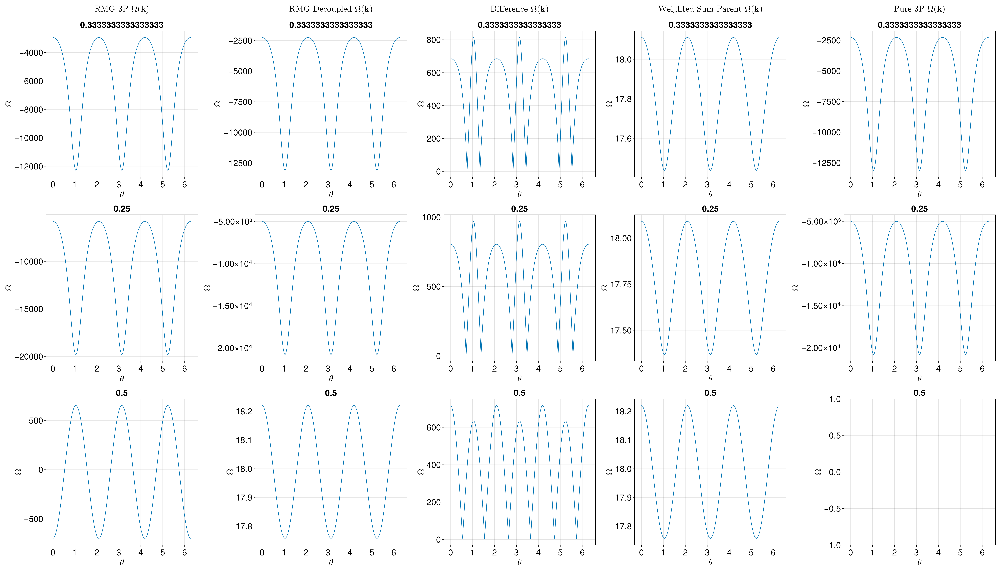

In [28]:
rmg_decouple_theta_bc(a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, m_kappa, vF, delta, alpha_list, w, p, pd)

<font size="12">Small alpha limit</font>

In [29]:
alpha_list = (1) * [exp(pi/3 * im), exp(pi/4 * im), exp(pi/2 * im)]
p = w / 2

0.005000000000000001

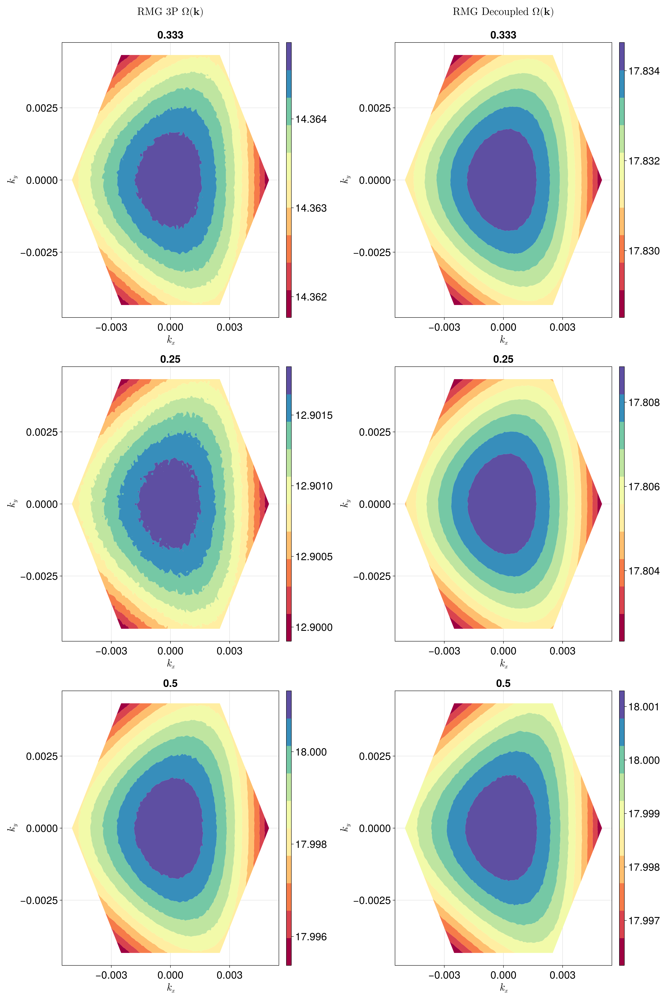

In [30]:
rmg_decoupled_comp(a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, m_kappa, vF, delta, alpha_list, w, pd)

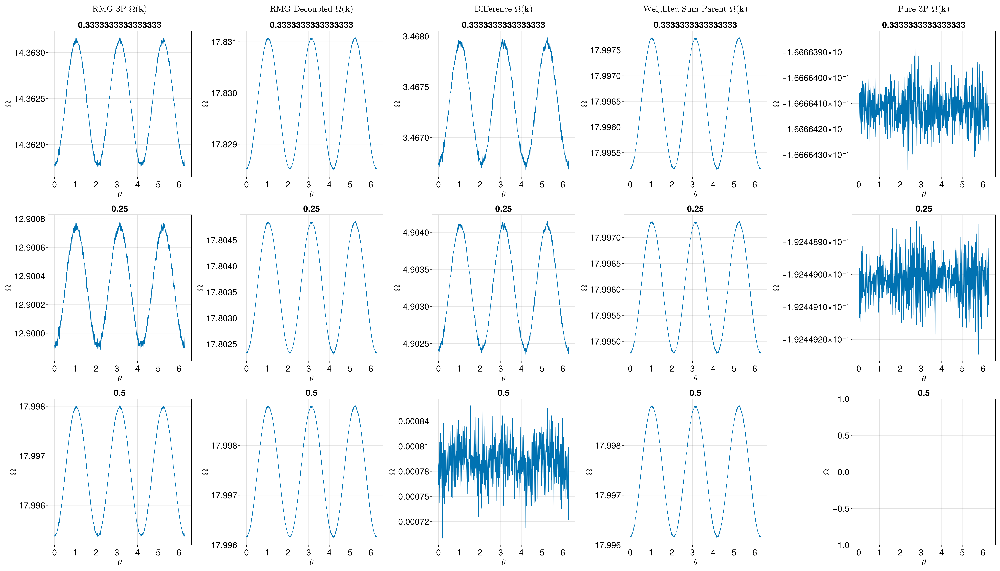

In [31]:
rmg_decouple_theta_bc(a, uD, t0, t1, t2, t3, t4, Nl, index, kappa, m_kappa, vF, delta, alpha_list, w, p, pd)